# MASG: Microphone Array Speech Generator in room acoustic

Microphone array speech generator (MASG) is used to simulate the speech data received by microphone array of various shapes in room acoustic environment, including clean speech (clean), reverberation speech (clean rever), noisy speech (clean noise), noisy and reverberation speech (clean rever niose) and corresponding noise signal (noise).

## Target speech, Noise signal and Parameter setting

Load common packages (including numpy, matplotlib, scipy), pyroomacoustic [1], add_noise_for_multichannel [2] and IPython.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
import pyroomacoustics as pra
import add_noise_for_multichannel as an
import IPython

Set common parameters: room size, target location, target speech file, noise file, SNR, microphone array, microphone amplification factor (AMP) and absorption coefficient of room wall. According to the room size and the absorption coefficient of the room wall, the reverberation time in the current acoustic environment can be calculated as

$$ RT_{60}=\frac{0.161V}{\alpha S} $$

Where *V* is the volume of the room, *S* is the surface area of the room, and *α* is the absorption coefficient of the room wall.

In [26]:
# room size
room_size = [4, 6, 3.5]
# target source location
target_location = [1.0, 4.5, 1.76]
# target & interf speech file
target_speech_file = 'male.wav'
#interf_speech_file = 'C:/Projects/chengrui/Multi_Data/Data/Sources/female.wav'
# read speech file
fs, target = wavfile.read(target_speech_file)
#_, interf = wavfile.read('C:/Projects/chengrui/Multi_Data/Data/Sources/female.wav')
# noise file
noise_file = 'babble.wav'
# read noise file
fs, noise = wavfile.read(noise_file)
# signal to noise
SNR = 5
# microphone array
microphone_array = np.c_[
    [1.82, 1.5, 1.76],  # mic 0
    [1.86, 1.5, 1.76],  # mic 1
    [1.90, 1.5, 1.76],  # mic 2
    [1.94, 1.5, 1.76],  # mic 3
    ]
# microphone amplification
amp = 10
# absorption
absorption_value = 0.35

#### Target speech: a 3-second male speech segment randomly selected from the TIMIT database, with a sampling rate of 16KHz.

In [27]:
# display
IPython.display.Audio(target, rate=fs)

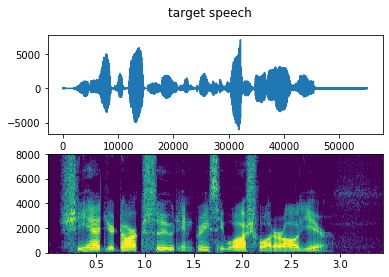

In [28]:
# figure
plt.figure()
plt.suptitle('target speech')
plt.subplot(2,1,1)
plt.plot(target)
plt.subplot(2,1,2)
_, _, _, _ = plt.specgram(target, NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)

#### Noise signal: babble noise selected from noise database of NoiseX-92, with sampling rate of 16KHz.

In [29]:
# display
IPython.display.Audio(noise, rate=fs)

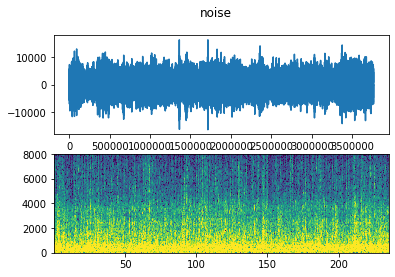

In [30]:
# figure
plt.figure()
plt.suptitle('noise')
plt.subplot(2,1,1)
plt.plot(noise)
plt.subplot(2,1,2)
_, _, _, _ = plt.specgram(noise, NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)

## Microphone array clean speech (clean)

By setting the absorption coefficient of the room wall to 1.0 (that is, the wall absorbs all the sound), the clean speech without reverberation received by the microphone array is obtained.

In [31]:
# create the room
room = pra.ShoeBox(room_size, fs=16000, absorption=1.0, max_order=17)

# add source
room.add_source(target_location, signal=target, delay=0)
#room.add_source([3.5, 3.0, 1.76], signal=interf[:len(target)], delay=0)

# add microphone array
R = microphone_array
fft_len = 512
Lg_t = 0.100
Lg = np.ceil(Lg_t*room.fs)
mic_array = pra.Beamformer(R, room.fs, N=fft_len, Lg=Lg)
room.add_microphone_array(mic_array)

# create the room impulse response
# compute image sources
room.image_source_model(use_libroom=True)

# microphone speech
room.simulate()

# clean speech in each channel
clean = amp*room.mic_array.signals.astype("int16")

#### Microphone array clean speech (clean): channel 0

In [32]:
# display
IPython.display.Audio(clean[0,:], rate=fs)

#### Microphone array clean speech (clean): channel 1

In [33]:
# display
IPython.display.Audio(clean[1,:], rate=fs)

#### Microphone array clean speech (clean): channel 2

In [34]:
# display
IPython.display.Audio(clean[2,:], rate=fs)

#### Microphone array clean speech (clean): channel 3

In [35]:
# display
IPython.display.Audio(clean[3,:], rate=fs)

#### Microphone array clean speech (clean): time domain waveform and spectrogram

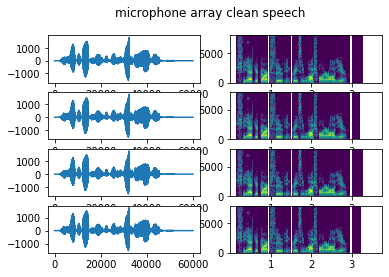

In [36]:
# figure
plt.figure()
plt.suptitle('microphone array clean speech')
plt.subplot(4,2,1)
plt.plot(clean[0,:])
plt.subplot(4,2,2)
_, _, _, _ = plt.specgram(clean[0,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,3)
plt.plot(clean[1,:])
plt.subplot(4,2,4)
_, _, _, _ = plt.specgram(clean[1,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,5)
plt.plot(clean[2,:])
plt.subplot(4,2,6)
_, _, _, _ = plt.specgram(clean[2,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,7)
plt.plot(clean[3,:])
plt.subplot(4,2,8)
_, _, _, _ = plt.specgram(clean[3,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)

## Microphone array reverberation speech (clean_rever)

By setting the absorption coefficient of the room wall, the reverberation speech received by the microphone array is obtained.

In [37]:
# create the room
room = pra.ShoeBox(room_size, fs=16000, absorption=absorption_value, max_order=17)

# add source
_, target = wavfile.read(target_speech_file)
#_, interf = wavfile.read('C:/Projects/chengrui/Multi_Data/Data/Sources/female.wav')

room.add_source(target_location, signal=target, delay=0)
#room.add_source([3.5, 3.0, 1.76], signal=interf[:len(target)], delay=0)

# add microphone array
R = microphone_array
fft_len = 512
Lg_t = 0.100
Lg = np.ceil(Lg_t*room.fs)
mic_array = pra.Beamformer(R, room.fs, N=fft_len, Lg=Lg)
room.add_microphone_array(mic_array)

# create the room impulse response
# compute image sources
room.image_source_model(use_libroom=True)

# microphone speech
room.simulate()

# clean speech in each channel
clean_rever = amp*room.mic_array.signals.astype("int16")

#### Microphone array reverberation speech (clean_rever): channel 0

In [38]:
# display
IPython.display.Audio(clean_rever[0,:], rate=fs)

#### Microphone array reverberation speech (clean_rever): channel 1

In [39]:
# display
IPython.display.Audio(clean_rever[1,:], rate=fs)

#### Microphone array reverberation speech (clean_rever): channel 2

In [40]:
# display
IPython.display.Audio(clean_rever[2,:], rate=fs)

#### Microphone array reverberation speech (clean_rever): channel 3

In [41]:
# display
IPython.display.Audio(clean_rever[3,:], rate=fs)

#### Microphone array reverberation speech (clean_rever): time domain waveform and spectrogram

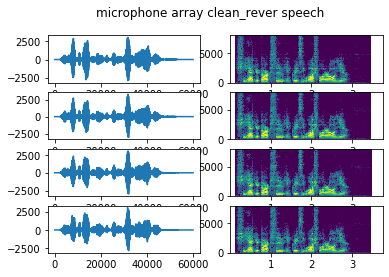

In [42]:
# figure
plt.figure()
plt.suptitle('microphone array clean_rever speech')
plt.subplot(4,2,1)
plt.plot(clean_rever[0,:])
plt.subplot(4,2,2)
_, _, _, _ = plt.specgram(clean_rever[0,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,3)
plt.plot(clean_rever[1,:])
plt.subplot(4,2,4)
_, _, _, _ = plt.specgram(clean_rever[1,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,5)
plt.plot(clean_rever[2,:])
plt.subplot(4,2,6)
_, _, _, _ = plt.specgram(clean_rever[2,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,7)
plt.plot(clean_rever[3,:])
plt.subplot(4,2,8)
_, _, _, _ = plt.specgram(clean_rever[3,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)

## Microphone array noise signal (noise), Microphone array noisy speech (clean_noise), Microphone array noisy and reverberation speech (clean_rever_noise)

According to the microphone array clean speech and signal-to-noise ratio (SNR), the corresponding microphone array noise signal is obtained, and the microphone array noise signal is added to the microphone array clean speech and the microphone array reverberation speech in the form of additive noise to get the corresponding microphone array noisy speech and the microphone array noisy and reverberation speech.

In [43]:
# add noise
out_clean_rever_noise, out_clean_noise, out_noise = an.addnoise(clean, clean_rever, noise, SNR, room.fs)

### Microphone array noise signal (noise)

#### Microphone array noise signal (noise): channel 0

In [44]:
# display
IPython.display.Audio(out_noise[0,:], rate=fs)

#### Microphone array noise signal (noise): channel 1

In [45]:
# display
IPython.display.Audio(out_noise[1,:], rate=fs)

#### Microphone array noise signal (noise): channel 2

In [46]:
# display
IPython.display.Audio(out_noise[2,:], rate=fs)

#### Microphone array noise signal (noise): channel 3

In [47]:
# display
IPython.display.Audio(out_noise[3,:], rate=fs)

#### Microphone array noise signal (noise): time domain waveform and spectrogram

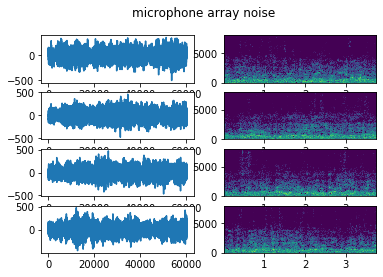

In [48]:
# figure
plt.figure()
plt.suptitle('microphone array noise')
plt.subplot(4,2,1)
plt.plot(out_noise[0,:])
plt.subplot(4,2,2)
_, _, _, _ = plt.specgram(out_noise[0,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,3)
plt.plot(out_noise[1,:])
plt.subplot(4,2,4)
_, _, _, _ = plt.specgram(out_noise[1,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,5)
plt.plot(out_noise[2,:])
plt.subplot(4,2,6)
_, _, _, _ = plt.specgram(out_noise[2,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,7)
plt.plot(out_noise[3,:])
plt.subplot(4,2,8)
_, _, _, _ = plt.specgram(out_noise[3,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)

### Microphone array noisy speech (clean_noise)

#### Microphone array noisy speech (clean_noise): channel 0

In [49]:
# display
IPython.display.Audio(out_clean_noise[0,:], rate=fs)

#### Microphone array noisy speech (clean_noise): channel 1

In [50]:
# display
IPython.display.Audio(out_clean_noise[1,:], rate=fs)

#### Microphone array noisy speech (clean_noise): channel 2

In [51]:
# display
IPython.display.Audio(out_clean_noise[2,:], rate=fs)

#### Microphone array noisy speech (clean_noise): channel 3

In [52]:
# display
IPython.display.Audio(out_clean_noise[3,:], rate=fs)

#### Microphone array noisy speech (clean_noise): time domain waveform and spectrogram

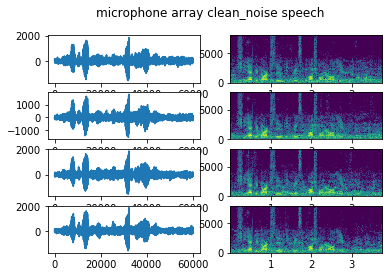

In [53]:
# figure
plt.figure()
plt.suptitle('microphone array clean_noise speech')
plt.subplot(4,2,1)
plt.plot(out_clean_noise[0,:])
plt.subplot(4,2,2)
_, _, _, _ = plt.specgram(out_clean_noise[0,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,3)
plt.plot(out_clean_noise[1,:])
plt.subplot(4,2,4)
_, _, _, _ = plt.specgram(out_clean_noise[1,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,5)
plt.plot(out_clean_noise[2,:])
plt.subplot(4,2,6)
_, _, _, _ = plt.specgram(out_clean_noise[2,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,7)
plt.plot(out_clean_noise[3,:])
plt.subplot(4,2,8)
_, _, _, _ = plt.specgram(out_clean_noise[3,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)

### Microphone array noisy and reverberation speech (clean_rever_noise)

#### Microphone array noisy and reverberation speech (clean_rever_noise): channel 0

In [54]:
# display
IPython.display.Audio(out_clean_rever_noise[0,:], rate=fs)

#### Microphone array noisy and reverberation speech (clean_rever_noise): channel 1

In [55]:
# display
IPython.display.Audio(out_clean_rever_noise[1,:], rate=fs)

#### Microphone array noisy and reverberation speech (clean_rever_noise): channel 2

In [56]:
# display
IPython.display.Audio(out_clean_rever_noise[2,:], rate=fs)

#### Microphone array noisy and reverberation speech (clean_rever_noise): channel 3

In [57]:
# display
IPython.display.Audio(out_clean_rever_noise[3,:], rate=fs)

#### Microphone array noisy and reverberation speech (clean_rever_noise): time domain waveform and spectrogram

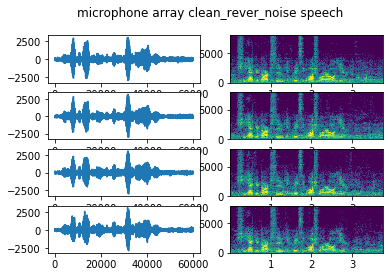

In [58]:
# figure
plt.figure()
plt.suptitle('microphone array clean_rever_noise speech')
plt.subplot(4,2,1)
plt.plot(out_clean_rever_noise[0,:])
plt.subplot(4,2,2)
_, _, _, _ = plt.specgram(out_clean_rever_noise[0,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,3)
plt.plot(out_clean_rever_noise[1,:])
plt.subplot(4,2,4)
_, _, _, _ = plt.specgram(out_clean_rever_noise[1,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,5)
plt.plot(out_clean_rever_noise[2,:])
plt.subplot(4,2,6)
_, _, _, _ = plt.specgram(out_clean_rever_noise[2,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)
plt.subplot(4,2,7)
plt.plot(out_clean_rever_noise[3,:])
plt.subplot(4,2,8)
_, _, _, _ = plt.specgram(out_clean_rever_noise[3,:], NFFT=256, Fs=fs, noverlap=128, vmin=-20, vmax=30)

## References

[1] R. Scheibler, E. Bezzam and I. Dokmanić, "Pyroomacoustics: A Python Package for Audio Room Simulation and Array Processing Algorithms," 2018 IEEE International Conference on Acoustics, Speech and Signal Processing (ICASSP), Calgary, AB, 2018, pp. 351-355.

[2] ITU-T (1993). Objective measurement of active speech level. ITU-T Recommendation P. 56

Author: Rui Cheng